# Import necessary libraries

In [1]:
import os
import glob
import torch
import cv2
import random
from tqdm import tqdm
import numpy as np
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
torch.manual_seed(42)

In [3]:
# Get cpu, gpu or mps device for training.
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [4]:
mask_paths = glob.glob('/kaggle/input/lgg-mri-segmentation/kaggle_3m/*/*_mask*')
image_paths = [i.replace('_mask', '') for i in mask_paths]
print(f'{len(mask_paths)} {len(image_paths)}')

3929 3929


# Helper functions

In [5]:
def plot_from_img_path(n_examples, list_img_paths, list_mask_paths):
    
    fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
    i = 0
    for ax in axs:
        image, mask = list_img_paths[i], list_mask_paths[i]
        image, mask = cv2.imread(image), cv2.imread(mask)
        ax[0].set_title("MRI images")
        ax[0].imshow(image)
        ax[1].set_title("Highlited abnormality")
        ax[1].imshow(image)
        ax[1].imshow(mask, alpha=0.2)
        ax[2].imshow(mask)
        ax[2].set_title("Abnormality mask")
        i += 1
 

# Visualizing images and masks

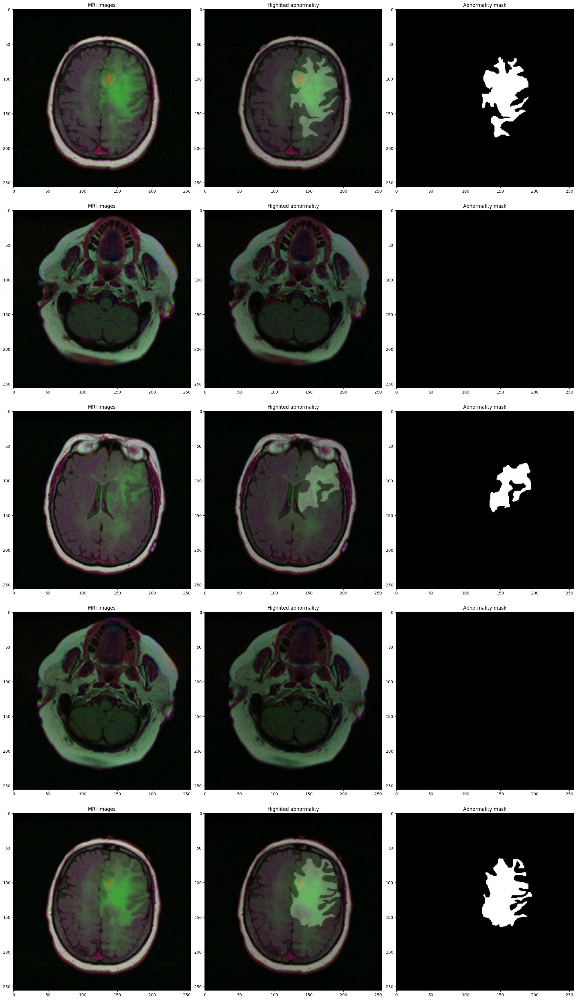

In [6]:
plot_from_img_path(n_examples=5, list_img_paths=image_paths[5:], list_mask_paths=mask_paths[5:])

# Create dataframe and split dataset into train, val and test sets

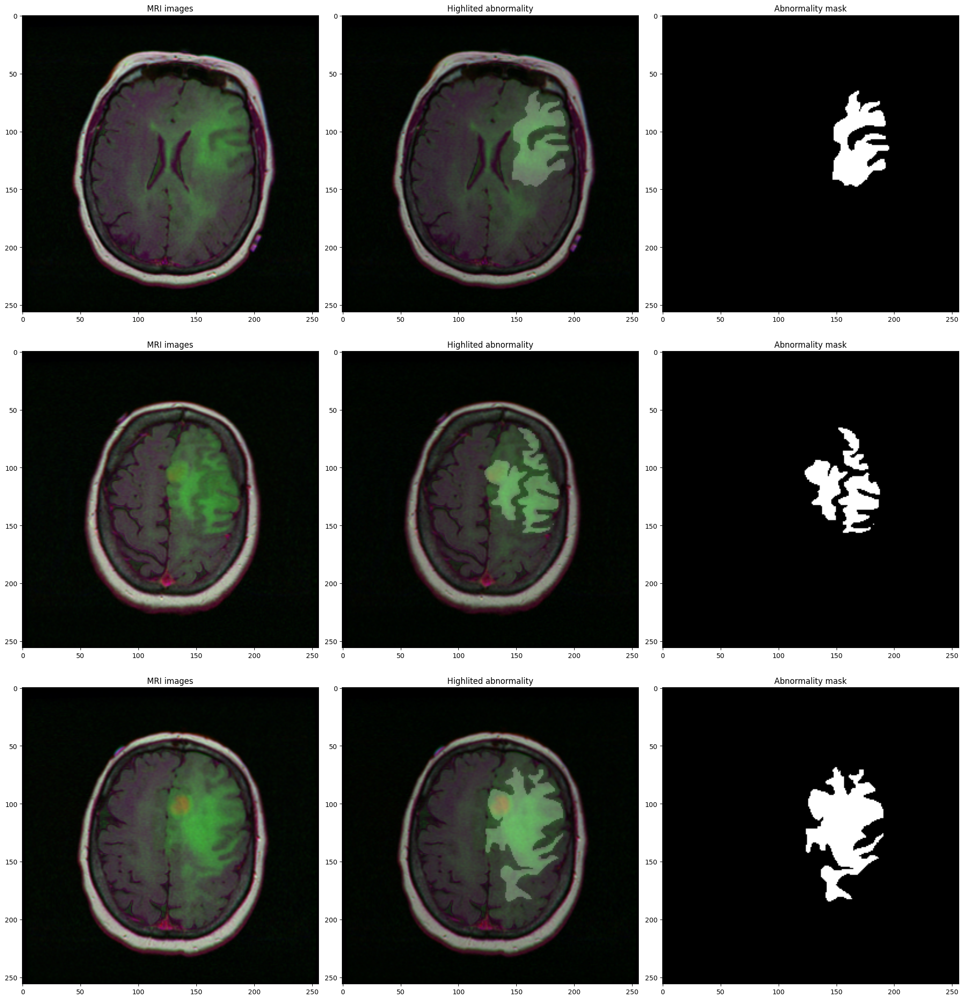

In [7]:
df = pd.DataFrame(data={'image': image_paths, 'mask': mask_paths})
df.head()
plot_from_img_path(n_examples=3, list_img_paths=df.iloc[[3,4,5],0].tolist(), list_mask_paths=df.iloc[[3,4,5],1].tolist())

In [8]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=42)
df_test, df_val = train_test_split(df_test, test_size=0.3, random_state=42)

print('train')
print(f"{df_train.describe().loc['count', ['image', 'mask']]}\n")
print('val')
print(f"{df_val.describe().loc['count', ['image', 'mask']]}\n")
print('test')
print(f"{df_test.describe().loc['count', ['image', 'mask']]}\n")

train
image    2750
mask     2750
Name: count, dtype: object

val
image    354
mask     354
Name: count, dtype: object

test
image    825
mask     825
Name: count, dtype: object



In [9]:
class MRI_Dataset(Dataset):
    def __init__(self, df, img_transform=None, mask_transform=None):
        self.image_paths = df['image']
        self.mask_paths = df['mask']
        self.img_transform = img_transform
        self.mask_transform = mask_transform
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_file = self.image_paths.iloc[idx]
        mask_file = self.mask_paths.iloc[idx]
        
        img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)

        if self.img_transform:
            img = self.img_transform(img)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        
        return img, mask

In [10]:
train_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
train_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [11]:
val_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
val_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [12]:
test_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
test_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [13]:
train_dataset = MRI_Dataset(df_train, img_transform=train_img_transform, mask_transform=train_mask_transform)
val_dataset = MRI_Dataset(df_val, img_transform=val_img_transform, mask_transform=val_mask_transform)
test_dataset = MRI_Dataset(df_test, img_transform=test_img_transform, mask_transform=test_mask_transform)

In [14]:
batch_size = 16

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)

In [15]:
for img, mask in train_dataloader:
    print(img.shape)
    print(mask.shape)
    break

torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 256, 256])


In [20]:
!pip install segmentation-models-pytorch

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 9.1 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=26028cf1cd2dd8abc6ec7649449aaa6f8ebedb30ff083f010c12e13fbf4909fe
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=f499c9cc85bc2e06ceb7d89314b004d4715e4e5177af5cb809bb51ad676216d8
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch pretrainedmodels


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20, Train Loss: 0.0401, Val Loss: 0.0174
Epoch 2/20, Train Loss: 0.0144, Val Loss: 0.0577
Epoch 3/20, Train Loss: 0.0106, Val Loss: 0.0109
Epoch 4/20, Train Loss: 0.0094, Val Loss: 0.0115
Epoch 5/20, Train Loss: 0.0083, Val Loss: 0.0087
Epoch 6/20, Train Loss: 0.0108, Val Loss: 0.0087
Epoch 7/20, Train Loss: 0.0080, Val Loss: 0.0097
Epoch 8/20, Train Loss: 0.0067, Val Loss: 0.0110
Epoch 9/20, Train Loss: 0.0062, Val Loss: 0.0071
Epoch 10/20, Train Loss: 0.0057, Val Loss: 0.0069
Epoch 11/20, Train Loss: 0.0052, Val Loss: 0.0077
Epoch 12/20, Train Loss: 0.0050, Val Loss: 0.0078
Epoch 13/20, Train Loss: 0.0062, Val Loss: 0.0081
Epoch 14/20, Train Loss: 0.0051, Val Loss: 0.0076
Epoch 15/20, Train Loss: 0.0045, Val Loss: 0.0066
Epoch 16/20, Train Loss: 0.0040, Val Loss: 0.0067
Epoch 17/20, Train Loss: 0.0039, Val Loss: 0.0092
Epoch 18/20, Train Loss: 0.0038, Val Loss: 0.0066
Epoch 19/20, Train Loss: 0.0035, Val Loss: 0.0070
Epoch 20/20, Train Loss: 0.0040, Val Loss: 0.0102


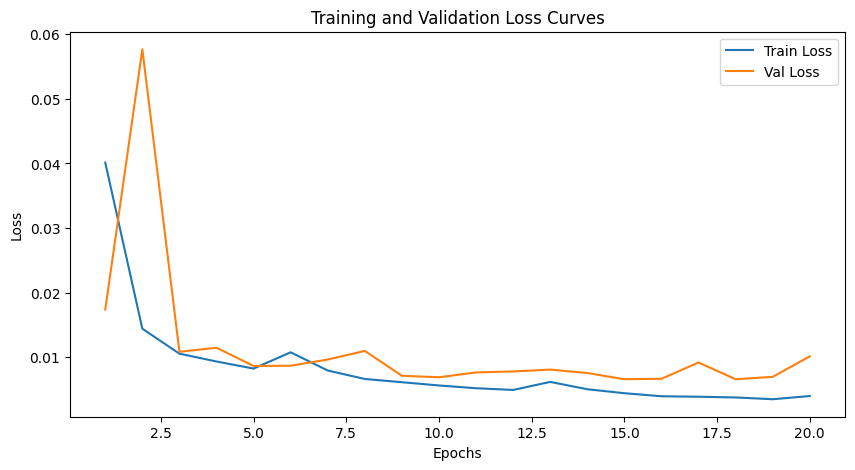

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

# Define U-Net with ResNeXt-50 backbone
class UNetResNeXt50(nn.Module):
    def __init__(self):
        super(UNetResNeXt50, self).__init__()
        
        # Load ResNeXt-50 backbone
        resnext50 = models.resnext50_32x4d(pretrained=True)
        self.encoder = nn.Sequential(*list(resnext50.children())[:-2])  # Remove the FC layer
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Training Loop

def train_model(model, train_loader, val_loader, num_epochs=20, lr=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    train_losses, val_losses = [], []
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
        
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    
    # Plot loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss')
    plt.plot(range(1, num_epochs+1), val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss Curves')
    plt.show()

# Example usage (assuming train_loader and val_loader are defined)
model = UNetResNeXt50()
train_model(model, train_dataloader, val_dataloader)

# Test set evaluation

In [25]:
criterion = nn.BCELoss()
def test_set_evaluation(models):
    for key, model in models.items():
        with torch.no_grad():
            running_loss = 0
            for i, data in enumerate(test_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                loss = criterion(predictions, mask)
                running_loss += loss.item() * img.size(0)
            loss = running_loss / len(test_dataset)
            
            print(f'Test loss with {key}: {loss}')

In [26]:
test_set_evaluation({"current_model": model})

Test loss with current_model: 0.011037164354753314


In [27]:
torch.save(model.state_dict(), "unet_resnext50_model.pth")

In [28]:
def visualize_segmentation(model, dataloader, num_examples=1):
    model.eval()  

    # Get all indices of the dataset and randomly sample 'num_examples' indices
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  # Access the dataset by index
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  # Add batch dimension

        with torch.no_grad():
            pred = model(img)

        # Squeeze to remove batch and channel dimensions
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  # Convert to HWC format for display
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5

        # Plot
        fig, axes = plt.subplots(1, 4, figsize=(12, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()


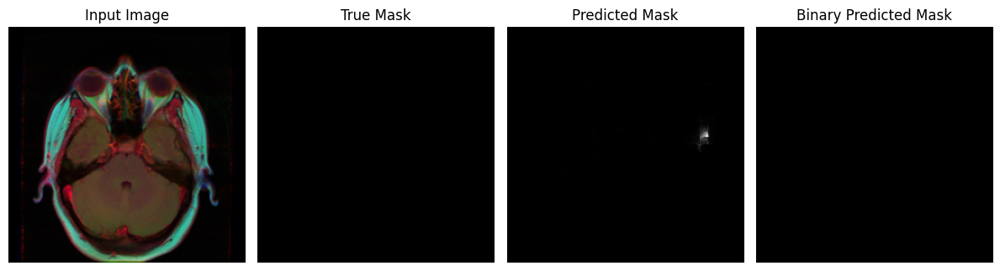

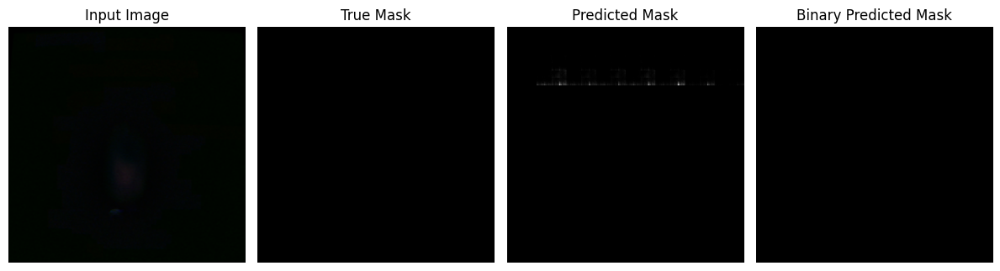

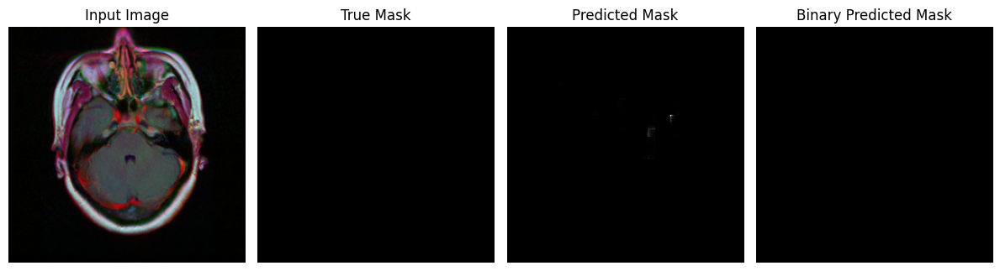

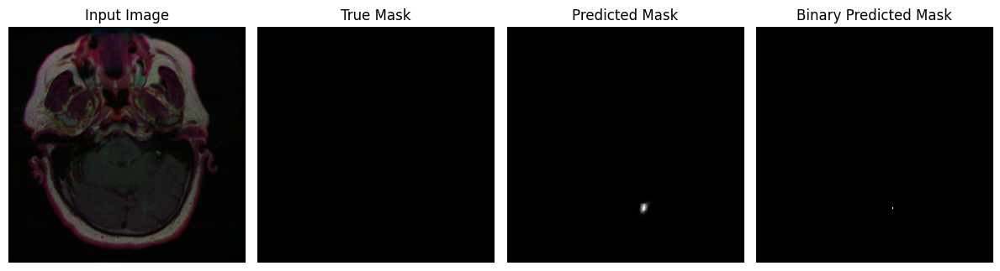

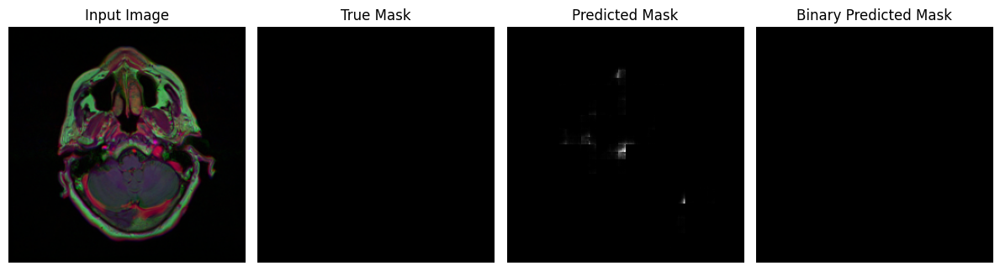

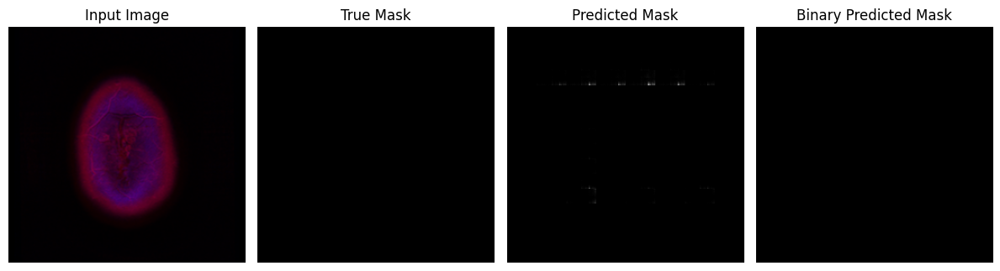

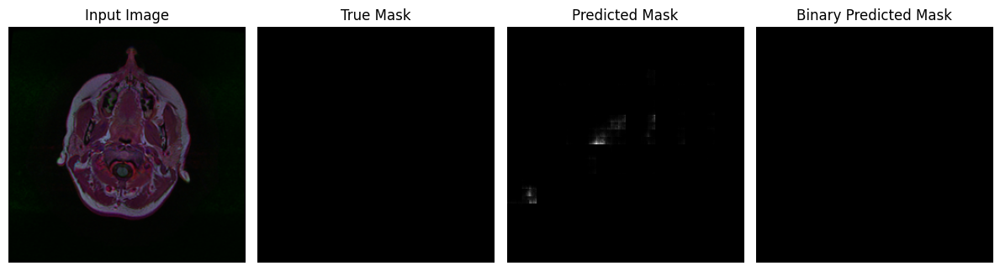

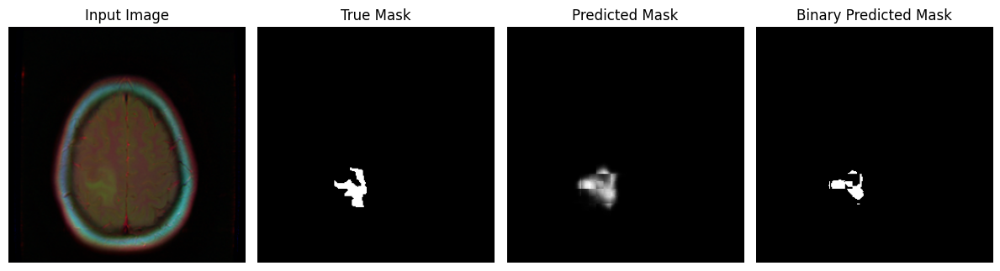

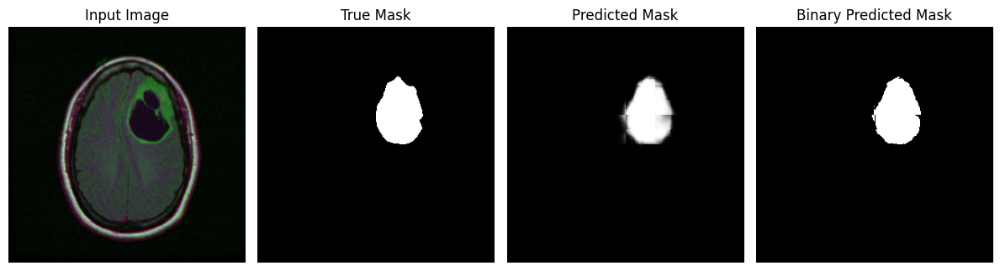

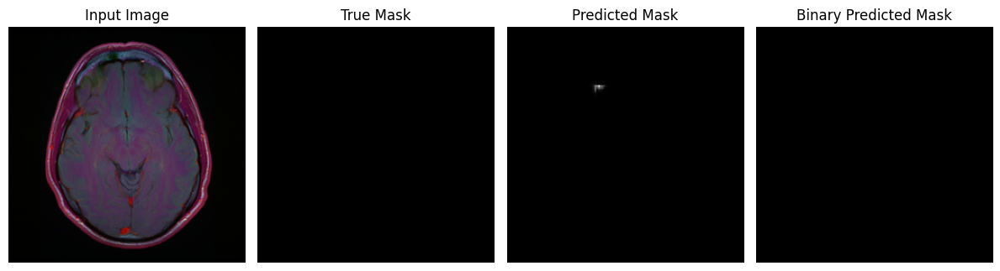

In [29]:
visualize_segmentation(model, test_dataloader, 10)

# Models benchmarking with different epochs

In [30]:
from skimage.segmentation import mark_boundaries

def dice_score(pred, target, epsilon=1e-6):
    """Computes Dice Similarity Coefficient (DSC)."""
    pred = pred > 0.5  # Convert to binary mask
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    return (2. * intersection + epsilon) / (np.sum(pred) + np.sum(target) + epsilon)

def iou_score(pred, target, epsilon=1e-6):
    """Computes Intersection over Union (IoU)."""
    pred = pred > 0.5
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    union = np.sum(pred) + np.sum(target) - intersection
    return (intersection + epsilon) / (union + epsilon)

def visualize_segmentation_new(model, dataloader, num_examples=1, device='cuda'):
    model.eval()
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  

        with torch.no_grad():
            pred = model(img)

        # Convert tensors to numpy arrays
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5  

        # Compute Dice and IoU scores
        dice = dice_score(binary_pred, mask)
        iou = iou_score(binary_pred, mask)

        # Normalize image for display
        img = (img - img.min()) / (img.max() - img.min())

        # Convert masks to integer type for mark_boundaries
        mask_int = mask.astype(int)
        binary_pred_int = binary_pred.astype(int)

        # Overlay segmentation boundaries on MRI image
        img_gt_overlay = mark_boundaries(img, mask_int, color=(0, 1, 0))  
        img_pred_overlay = mark_boundaries(img_gt_overlay, binary_pred_int, color=(1, 0, 0))  

        # Plot results
        fig, axes = plt.subplots(1, 5, figsize=(15, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        axes[4].imshow(img_pred_overlay)
        axes[4].set_title(f'Overlay: GT (Green) & Pred (Red)\nDice: {dice:.4f}, IoU: {iou:.4f}')
        axes[4].axis('off')

        print(dice, iou)
        plt.tight_layout()
        plt.show()


1.0 1.0


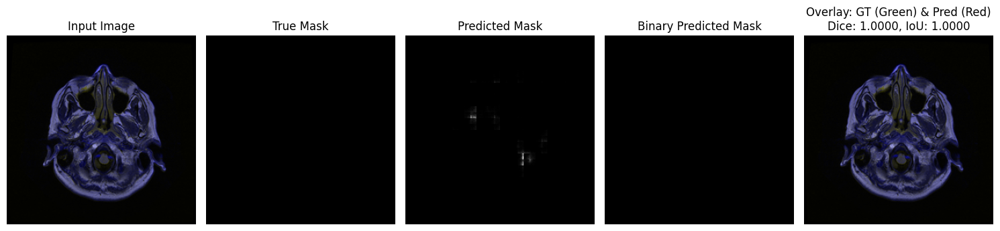

1.0 1.0


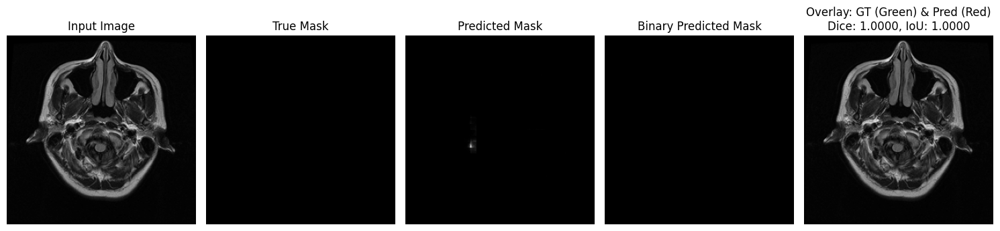

1.0 1.0


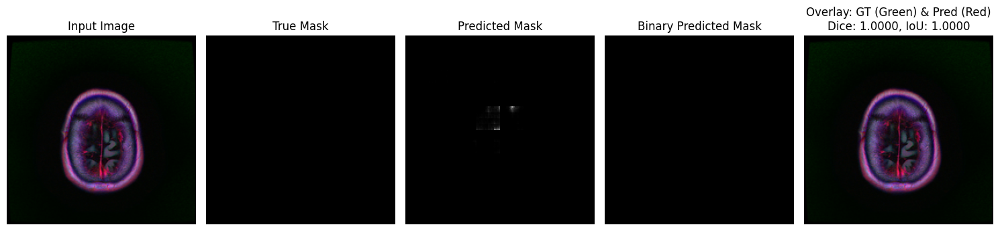

1.0 1.0


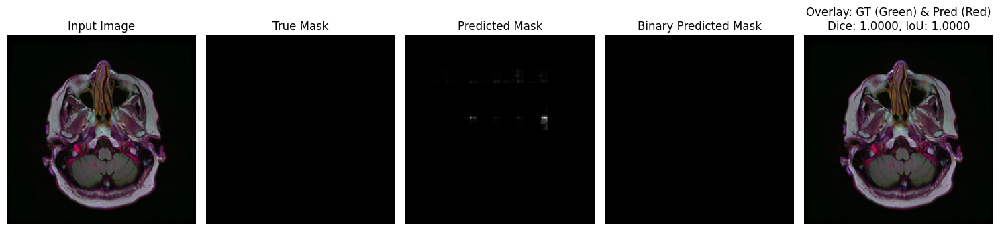

1.0 1.0


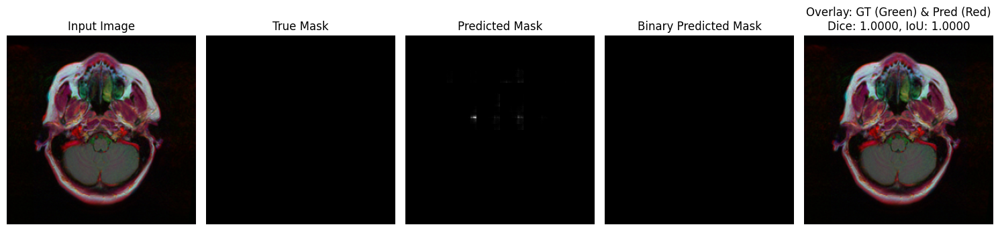

1.0 1.0


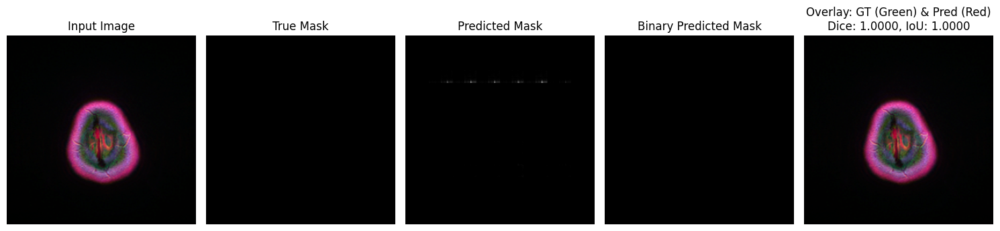

1.0 1.0


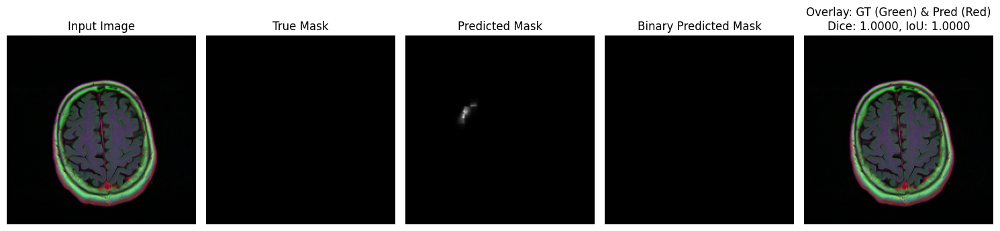

0.9241647878741377 0.8590207658870221


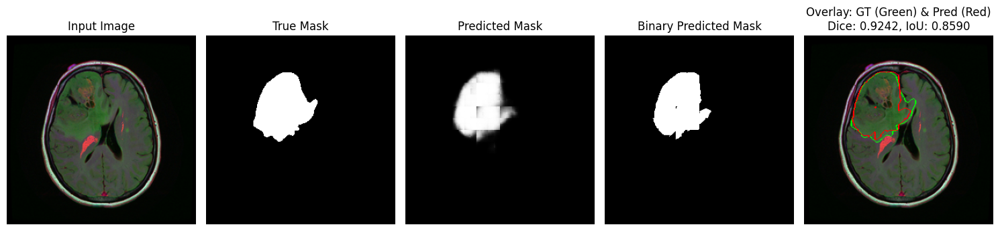

1.0 1.0


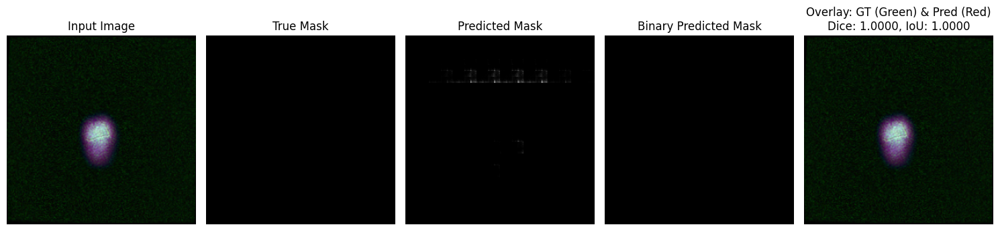

1.0 1.0


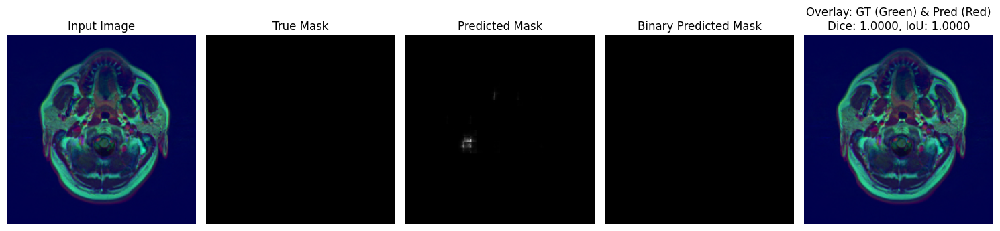

In [31]:
visualize_segmentation_new(model, test_dataloader, 10)